# Init

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from astropy.io import fits
from astropy.visualization import simple_norm
import photutils
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.stats import SigmaClip
from photutils.background import Background2D, MedianBackground
from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.segmentation import detect_threshold, detect_sources
from photutils.utils import circular_footprint
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils.segmentation import detect_sources
from scipy import stats
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.wcs import WCS
from photutils.detection import DAOStarFinder
from astroquery.gaia import Gaia
import pandas as pd
import subprocess
import shutil
from astropy.time import Time
from astropy.coordinates import SkyCoord, EarthLocation, AltAz
from pathlib import Path
from scipy.stats import siegelslopes

# Load files

In [2]:
init_path_g = Path("/mnt/c/Users/catal/Downloads/unistellar_observations/test_g_band")
init_path_b = Path("/mnt/c/Users/catal/Downloads/unistellar_observations/test_b_band")
init_path_r = Path("/mnt/c/Users/catal/Downloads/unistellar_observations/test_r_band")


solved_files = list(init_path_g.rglob("*.new"))
solved_files.extend(list(init_path_b.rglob("*.new")))
solved_files.extend(list(init_path_r.rglob("*.new")))

print(f"Found {len(solved_files)} solved files.")

for file in solved_files:
    with fits.open(file) as hdul:
        print(file.name, hdul[0].data.shape)

Found 30 solved files.
20260202T180749_464_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T180851_328_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T180923_002_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T181110_269_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T181320_905_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T181457_937_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T181609_569_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T181750_202_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T181944_118_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T182115_708_StackInput_DarkSubtracted_g_band.new (488, 652)
20260202T180805_352_StackInput_DarkSubtracted_b_band.new (488, 652)
20260202T180851_328_StackInput_DarkSubtracted_b_band.new (488, 652)
20260202T180958_748_StackInput_DarkSubtracted_b_band.new (488, 652)
20260202T181102_325_StackInput_DarkSubtracted_b_band.new (488, 652)
20260202T181142_043_Stack

In [3]:
bands = {'g': init_path_g, 'b': init_path_b, 'r': init_path_r}
rows = []

for band, init_path in bands.items():
    fits_files = list(init_path.rglob("*.new"))

    for file in fits_files:
        try:
            with fits.open(file) as hdul:
                header = hdul[0].header

                # Extract values safely (BIASLVL might not exist in all files)
                bias = header.get("BZERO")
                exptime = header.get("EXPTIME")
                gain = header.get("GAIN")

                obs_time = Time(header["DATE-OBS"], format="isot", scale="utc")

                location = EarthLocation(
                    lat=header["LATITUDE"] * u.deg,
                    lon=header["LONGITUD"] * u.deg,
                    height=header.get("ALTITUDE", 0) * u.m
                )

                rows.append({
                    "filename": file.name,
                    "band": band,
                    "bias": bias,
                    "exptime": exptime,
                    "gain": gain,
                    "obs_time": obs_time,
                    "location": location
                })

        except Exception as e:
            print(f"Error reading {file.name}: {e}")

# Convert to DataFrame
df = pd.DataFrame(rows)

print(df.head())

                                            filename band  bias   exptime  \
0  20260202T180749_464_StackInput_DarkSubtracted_...    g  None  3.971754   
1  20260202T180851_328_StackInput_DarkSubtracted_...    g  None  3.971754   
2  20260202T180923_002_StackInput_DarkSubtracted_...    g  None  3.971754   
3  20260202T181110_269_StackInput_DarkSubtracted_...    g  None  3.971754   
4  20260202T181320_905_StackInput_DarkSubtracted_...    g  None  3.971754   

       gain                 obs_time  \
0  0.128711  2026-02-02T18:07:45.492   
1  0.128711  2026-02-02T18:08:47.356   
2  0.128711  2026-02-02T18:09:19.030   
3  0.128711  2026-02-02T18:11:06.297   
4  0.128711  2026-02-02T18:13:16.933   

                                            location  
0  (3950552.8798473445, 502120.2027838626, 496563...  
1  (3950552.8798473445, 502120.2027838626, 496563...  
2  (3950552.8798473445, 502120.2027838626, 496563...  
3  (3950552.8798473445, 502120.2027838626, 496563...  
4  (3950552.879847344

 ## Statistics of new image

In [4]:
bands = {'g': init_path_g, 'b': init_path_b, 'r': init_path_r}
rows = []

for band, init_path in bands.items():
    fits_files = list(init_path.rglob("*.new"))
    for file in fits_files:
        try:
            with fits.open(file) as hdul:
                data = hdul[0].data.astype(np.float32)

                mean, median, std = sigma_clipped_stats(data, sigma=3.0)
                mode = 3 * median - 2 * mean

                rows.append({
                    "filename": file.name,
                    "band": band,
                    "mean": mean,
                    "median": median,
                    "std": std,
                    "mode": mode
                })

                print(f"{band}: {file.name}: "
                      f"Mean: {mean:.3f}, "
                      f"Median: {median:.3f}, "
                      f"Std: {std:.3f}, "
                      f"Mode: {mode:.3f} ADU")

        except Exception as e:
            print(f"Error processing {file.name}: {e}")

# Convert to DataFrame
df_stats = pd.DataFrame(rows)

print("\nSummary:")
print(df_stats.head())

g: 20260202T180749_464_StackInput_DarkSubtracted_g_band.new: Mean: 10441.425, Median: 10434.500, Std: 823.938, Mode: 10420.650 ADU
g: 20260202T180851_328_StackInput_DarkSubtracted_g_band.new: Mean: 6914.309, Median: 6905.250, Std: 663.861, Mode: 6887.132 ADU
g: 20260202T180923_002_StackInput_DarkSubtracted_g_band.new: Mean: 6904.349, Median: 6895.000, Std: 665.370, Mode: 6876.302 ADU
g: 20260202T181110_269_StackInput_DarkSubtracted_g_band.new: Mean: 5106.555, Median: 5098.500, Std: 565.660, Mode: 5082.391 ADU
g: 20260202T181320_905_StackInput_DarkSubtracted_g_band.new: Mean: 26964.855, Median: 26959.500, Std: 1327.195, Mode: 26948.789 ADU
g: 20260202T181457_937_StackInput_DarkSubtracted_g_band.new: Mean: 27902.662, Median: 27896.500, Std: 1351.348, Mode: 27884.176 ADU
g: 20260202T181609_569_StackInput_DarkSubtracted_g_band.new: Mean: 13151.696, Median: 13146.000, Std: 919.094, Mode: 13134.607 ADU
g: 20260202T181750_202_StackInput_DarkSubtracted_g_band.new: Mean: 6596.059, Median: 6589.

## Use of DAOstars to find the stars inside new image coordinates

In [5]:
bands = {'g': init_path_g, 'b': init_path_b, 'r': init_path_r}
all_sources = []

for band, init_path in bands.items():
    fits_files = list(init_path.rglob("*.new"))
    for file in fits_files:
        try:
            with fits.open(file) as hdul:
                header = hdul[0].header
                data = hdul[0].data.astype(np.float32)

            # Build WCS
            wcs = WCS(header)

            # Compute background stats
            mean, median, std = sigma_clipped_stats(data, sigma=3.0)
            mode = 3 * median - 2 * mean

            # Star detection
            daofind = DAOStarFinder(fwhm=5.0, threshold=5.0 * std)
            sources = daofind(data - mode)

            if sources is None:
                print(f"No stars found in {file.name}")
                continue

            x = sources["xcentroid"]
            y = sources["ycentroid"]

            # Convert to RA/Dec
            ra, dec = wcs.all_pix2world(x, y, 0)

            image_coords = SkyCoord(ra=ra*u.deg,
                                    dec=dec*u.deg,
                                    frame="icrs")

            # Store everything
            for i in range(len(sources)):
                all_sources.append({
                    "filename": file.name,
                    "band": band,
                    "x_centroid": float(x[i]),
                    "y_centroid": float(y[i]),
                    "ra_deg": float(ra[i]),
                    "dec_deg": float(dec[i]),
                    "skycoord": image_coords[i]
                })

            print(f"{band}: {file.name}: detected {len(sources)} stars")

        except Exception as e:
            print(f"Error processing {file.name}: {e}")

# Convert to DataFrame
df_sources = pd.DataFrame(all_sources)

print("\nExtraction complete.")
print(df_sources.head())

g: 20260202T180749_464_StackInput_DarkSubtracted_g_band.new: detected 96 stars
g: 20260202T180851_328_StackInput_DarkSubtracted_g_band.new: detected 40 stars
g: 20260202T180923_002_StackInput_DarkSubtracted_g_band.new: detected 139 stars
g: 20260202T181110_269_StackInput_DarkSubtracted_g_band.new: detected 94 stars
g: 20260202T181320_905_StackInput_DarkSubtracted_g_band.new: detected 13 stars
g: 20260202T181457_937_StackInput_DarkSubtracted_g_band.new: detected 9 stars
g: 20260202T181609_569_StackInput_DarkSubtracted_g_band.new: detected 21 stars
g: 20260202T181750_202_StackInput_DarkSubtracted_g_band.new: detected 30 stars
g: 20260202T181944_118_StackInput_DarkSubtracted_g_band.new: detected 27 stars
g: 20260202T182115_708_StackInput_DarkSubtracted_g_band.new: detected 55 stars
b: 20260202T180805_352_StackInput_DarkSubtracted_b_band.new: detected 80 stars
b: 20260202T180851_328_StackInput_DarkSubtracted_b_band.new: detected 27 stars
b: 20260202T180958_748_StackInput_DarkSubtracted_b_b

In [6]:
# Run DAOStarFinder over bias-subtracted / WCS images and export results
bands = {'g': init_path_g, 'b': init_path_b, 'r': init_path_r}
all_sources = []

for band, init_path in bands.items():
    fits_files = list(init_path.rglob("*.new"))
    for file in fits_files:
        try:
            with fits.open(file) as hdul:
                header = hdul[0].header
                data = hdul[0].data.astype(np.float32)

            # Build WCS
            wcs = WCS(header)

            # Compute background stats
            mean, median, std = sigma_clipped_stats(data, sigma=3.0)
            mode = 3 * median - 2 * mean

            # Star detection
            daofind = DAOStarFinder(fwhm=5.0, threshold=5.0 * std)
            sources = daofind(data - mode)

            if sources is None:
                print(f"No stars found in {file.name}")
                continue

            x = sources["xcentroid"]
            y = sources["ycentroid"]

            # Convert to RA/Dec
            ra, dec = wcs.all_pix2world(x, y, 0)

            # Store everything
            for i in range(len(sources)):
                all_sources.append({
                    "filename": file.name,
                    "band": band,
                    "x_centroid": float(x[i]),
                    "y_centroid": float(y[i]),
                    "ra_image": float(ra[i]),
                    "dec_image": float(dec[i]),
                    "flux": float(sources["flux"][i]),
                    "mag_inst": float(sources["mag"][i])
                })

            print(f"{band}: {file.name}: detected {len(sources)} stars")

        except Exception as e:
            print(f"Error processing {file.name}: {e}")

# Convert to DataFrame
df_sources = pd.DataFrame(all_sources)

print("\nExtraction complete.")
print(df_sources.head())

g: 20260202T180749_464_StackInput_DarkSubtracted_g_band.new: detected 96 stars
g: 20260202T180851_328_StackInput_DarkSubtracted_g_band.new: detected 40 stars
g: 20260202T180923_002_StackInput_DarkSubtracted_g_band.new: detected 139 stars
g: 20260202T181110_269_StackInput_DarkSubtracted_g_band.new: detected 94 stars
g: 20260202T181320_905_StackInput_DarkSubtracted_g_band.new: detected 13 stars
g: 20260202T181457_937_StackInput_DarkSubtracted_g_band.new: detected 9 stars
g: 20260202T181609_569_StackInput_DarkSubtracted_g_band.new: detected 21 stars
g: 20260202T181750_202_StackInput_DarkSubtracted_g_band.new: detected 30 stars
g: 20260202T181944_118_StackInput_DarkSubtracted_g_band.new: detected 27 stars
g: 20260202T182115_708_StackInput_DarkSubtracted_g_band.new: detected 55 stars
b: 20260202T180805_352_StackInput_DarkSubtracted_b_band.new: detected 80 stars
b: 20260202T180851_328_StackInput_DarkSubtracted_b_band.new: detected 27 stars
b: 20260202T180958_748_StackInput_DarkSubtracted_b_b

## Plot to check the matched centroids

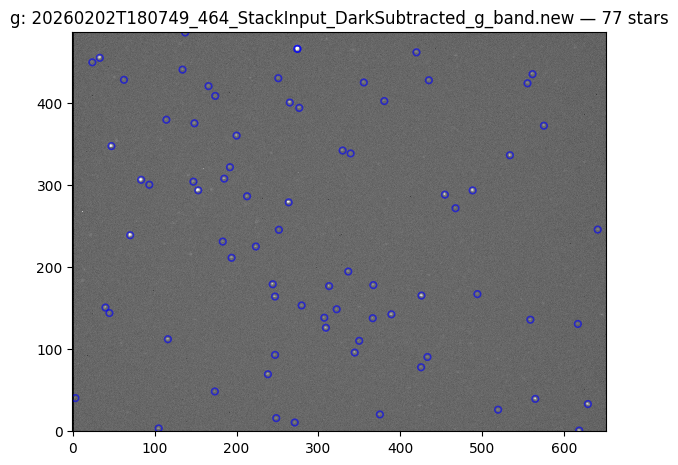

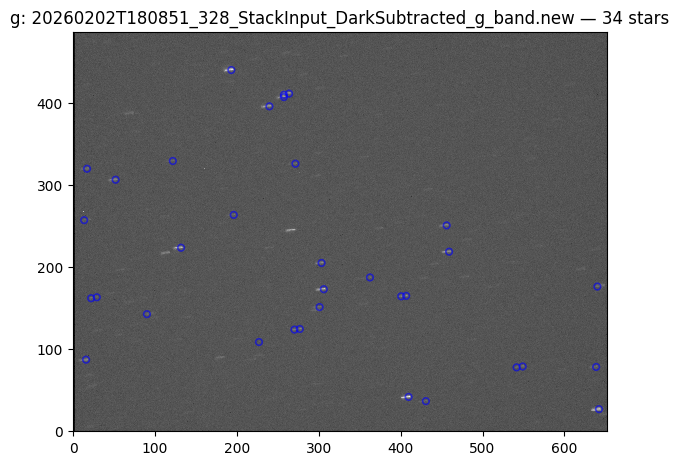

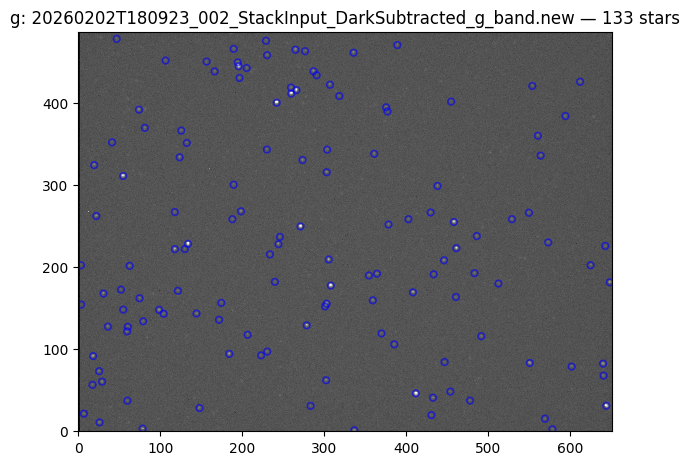

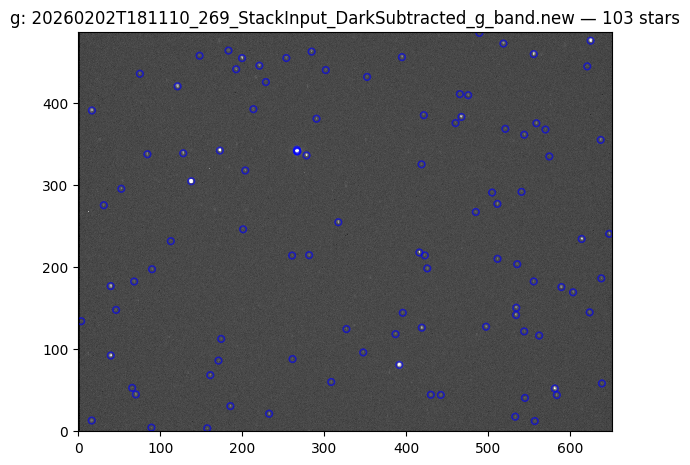

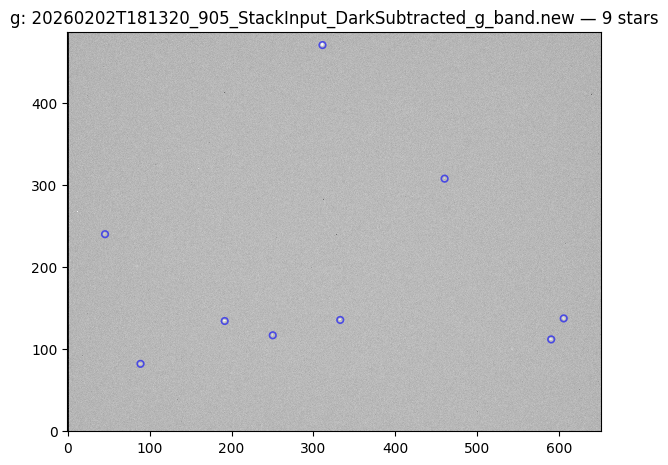

...

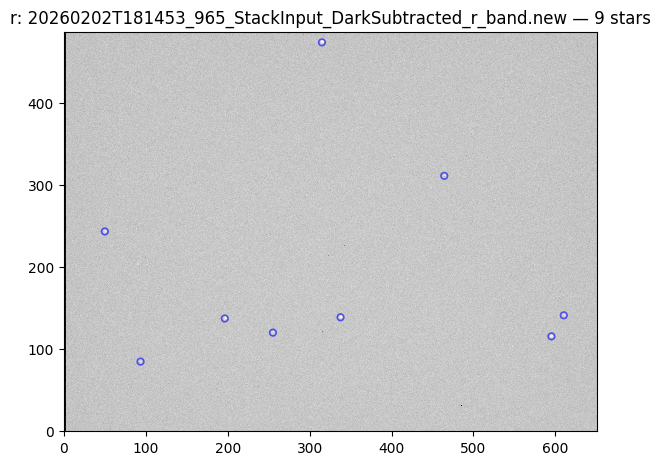

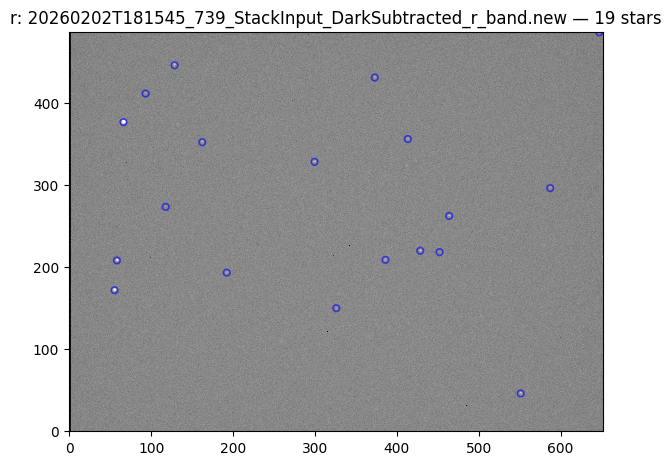

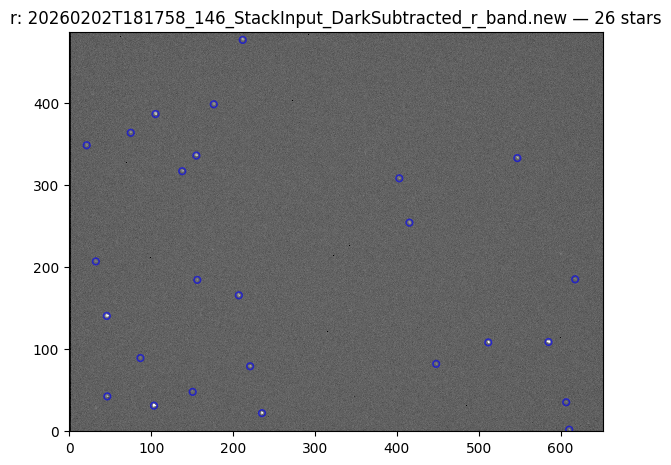

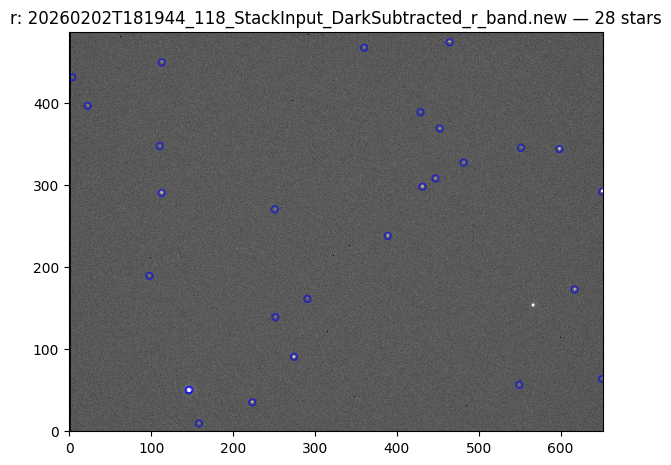

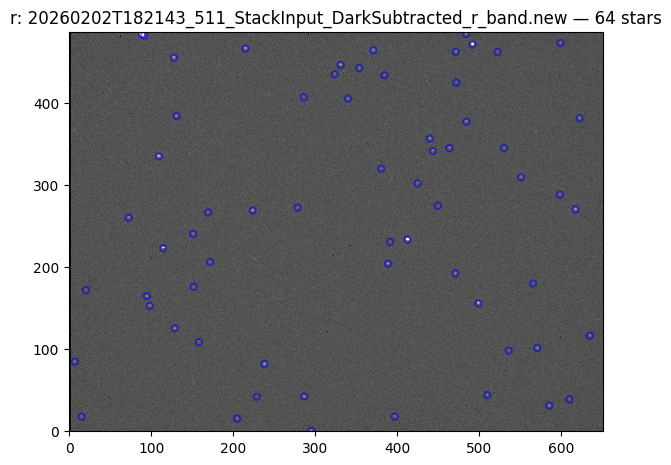

In [7]:
from photutils.aperture import CircularAperture

bands = {'g': init_path_g, 'b': init_path_b, 'r': init_path_r}

for band, init_path in bands.items():
    fits_files = list(init_path.rglob("*.new"))
    for file in fits_files:

        with fits.open(file) as hdul:
            data = hdul[0].data.astype(np.float32)

        # Background stats
        mean, median, std = sigma_clipped_stats(data, sigma=3.0)
        mode = 3 * median - 2 * mean

        # Detect stars
        daofind = DAOStarFinder(fwhm=3.0, threshold=5.0 * std)
        sources = daofind(data - mode)

        if sources is None:
            print(f"No stars found in {file.name}")
            continue

        positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
        apertures = CircularAperture(positions, r=4.0)

        # Plot
        plt.figure(figsize=(6, 5))
        norm = ImageNormalize(data, stretch=SqrtStretch())

        plt.imshow(data, cmap='gray', origin='lower',
                   norm=norm, interpolation='nearest')

        apertures.plot(color='blue', lw=1.2, alpha=0.6)

        plt.title(f"{band}: {file.name} — {len(sources)} stars")
        plt.tight_layout()
        plt.show()

## Gaia extraction

In [8]:
# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(111, projection=wcs)
# ax.imshow(data_wcs, origin='lower', cmap='gray', norm=norm)
# ax.set_xlabel('Right Ascension (J2000)')
# ax.set_ylabel('Declination (J2000)')
# ax.set_title('FITS Image with WCS')
# ax.grid(color='white', ls='dotted')
# plt.show()

In [9]:
sources

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,peak,flux,mag,daofind_mag
int64,float64,float64,float64,float32,float64,int64,float32,float32,float32,float64
1,295.51301013898,0.1609969169717629,0.9700958174728643,-0.36614123,-0.45898300311691764,25,16097.482,42314.234,-11.5662155,-0.992466807807688
2,204.74308670870886,15.019054307819303,0.5314673699051359,0.07290735,-0.36799542222983983,25,5309.4824,18953.06,-10.694199,-0.3168559737475151
3,14.834308647103306,17.34903479180648,0.6285756690631711,-0.26458463,0.5352193041617803,25,4714.4824,21574.06,-10.834829,-0.09166545573937786
4,397.3102198580089,17.51887181850733,0.7930217609309741,-0.6717907,-0.26658529561196886,25,7052.4824,21752.06,-10.843752,-0.2050166426310002
5,586.053465206589,30.915226534503642,0.7553154692510554,-0.5060073,-0.13096336476895173,25,23076.482,75736.06,-12.1982565,-1.5907247292761841
6,610.4853186020569,38.55723148003902,0.36476944931649213,0.14611654,-0.19752458061243935,25,5761.4824,26381.06,-11.05323,-0.6192272402273534
7,228.83460011546146,41.60021623849691,0.6581691281438694,0.43812597,0.044393087256429466,25,4857.4824,19074.06,-10.701108,-0.02852374087037625
8,286.7240295834082,42.001374267935056,0.9519339942797411,-0.23806366,-0.2777043484343194,25,28201.482,70997.06,-12.1281,-1.6450455368850567
9,510.2389793999683,43.70587462945145,0.8762664455566599,-0.32350013,-0.1133266140776282,25,15246.482,42998.062,-11.583623,-1.012237985853351


# Gaia crossmatch

In [18]:
Gaia.MAIN_GAIA_TABLE = "gaiadr3.gaia_source"
Gaia.ROW_LIMIT = 10000

bands = {'g': init_path_g, 'b': init_path_b, 'r': init_path_r}
matched_sources = []

# Loop over each bias-subtracted FITS image
for band, init_path in bands.items():
    fits_files = list(init_path.rglob("*.new"))
    for file in fits_files:

        # Open FITS
        with fits.open(file) as hdul:
            header = hdul[0].header
            data = hdul[0].data.astype(np.float32)

        # Build WCS
        wcs = WCS(header)

        # Background stats
        mean, median, std = sigma_clipped_stats(data, sigma=3.0)
        mode = 3 * median - 2 * mean

        # Detect stars
        daofind = DAOStarFinder(fwhm=3.0, threshold=5.0 * std)
        sources = daofind(data - mode)

        if sources is None:
            print(f"No stars found in {file.name}")
            continue

        x = sources["xcentroid"]
        y = sources["ycentroid"]
        flux = sources["flux"]
        mag_inst = sources["mag"]

        # Convert to RA/Dec
        ra, dec = wcs.all_pix2world(x, y, 0)
        image_coords = SkyCoord(ra=ra*u.deg, dec=dec*u.deg)

        # Gaia query
        center_coord = SkyCoord(np.mean(ra)*u.deg, np.mean(dec)*u.deg)
        radius = 0.4 * u.deg

        print(f"Querying Gaia for {band}: {file.name}...")
        job = Gaia.cone_search_async(coordinate=center_coord, radius=radius)
        gaia_table = job.get_results()

        if len(gaia_table) == 0:
            print(f"No Gaia sources found for {band}: {file.name}")
            continue

        gaia_coords = SkyCoord(ra=gaia_table["ra"], dec=gaia_table["dec"])

        # Cross-match image stars with Gaia
        idx, sep2d, _ = image_coords.match_to_catalog_sky(gaia_coords)
        max_sep = 2.0 * u.arcsec
        good_matches = sep2d < max_sep

        for i, match in enumerate(good_matches):
            if match:
                gaia_idx = idx[i]
                matched_sources.append({
                    "filename": file.name,
                    "band": band,
                    "x_centroid": float(x[i]),
                    "y_centroid": float(y[i]),
                    "ra_image": float(ra[i]),
                    "dec_image": float(dec[i]),
                    "flux": float(flux[i]),
                    "mag_inst": float(mag_inst[i]),
                    "ra_gaia": gaia_table["ra"][gaia_idx],
                    "dec_gaia": gaia_table["dec"][gaia_idx],
                    "phot_g_mean_mag": gaia_table["phot_g_mean_mag"][gaia_idx],
                    "phot_bp_mean_mag": gaia_table["phot_bp_mean_mag"][gaia_idx],
                    "phot_rp_mean_mag": gaia_table["phot_rp_mean_mag"][gaia_idx],
                    "separation_arcsec": sep2d[i].arcsec
                })

        print(f"{band}: {file.name}: {np.sum(good_matches)} matches found")

# Create DataFrame
df_matched = pd.DataFrame(matched_sources)

# Map Gaia magnitude to the corresponding instrumental band:
# 'g' -> phot_g_mean_mag, 'b' -> phot_bp_mean_mag, 'r' -> phot_rp_mean_mag

print(df_matched.head())

Querying Gaia for g: 20260202T180749_464_StackInput_DarkSubtracted_g_band.new...
INFO: Query finished. [astroquery.utils.tap.core]
g: 20260202T180749_464_StackInput_DarkSubtracted_g_band.new: 64 matches found
Querying Gaia for g: 20260202T180851_328_StackInput_DarkSubtracted_g_band.new...
INFO: Query finished. [astroquery.utils.tap.core]
g: 20260202T180851_328_StackInput_DarkSubtracted_g_band.new: 16 matches found
Querying Gaia for g: 20260202T180923_002_StackInput_DarkSubtracted_g_band.new...
INFO: Query finished. [astroquery.utils.tap.core]
g: 20260202T180923_002_StackInput_DarkSubtracted_g_band.new: 95 matches found
Querying Gaia for g: 20260202T181110_269_StackInput_DarkSubtracted_g_band.new...
INFO: Query finished. [astroquery.utils.tap.core]
g: 20260202T181110_269_StackInput_DarkSubtracted_g_band.new: 80 matches found
Querying Gaia for g: 20260202T181320_905_StackInput_DarkSubtracted_g_band.new...
INFO: Query finished. [astroquery.utils.tap.core]
g: 20260202T181320_905_StackInput

In [19]:
df_matched.to_csv("matched_sources_all_bands.csv", index=False)
df_matched

,filename,band,x_centroid,y_centroid,ra_image,dec_image,flux,mag_inst,ra_gaia,dec_gaia,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,separation_arcsec
0,20260202T180749_464_StackInput_DarkSubtracted_...,g,270.994625,10.231799,100.162519,17.144694,19212.740234,-10.708973,100.162304,17.144497,13.443441,13.678184,13.059092,1.022877
1,20260202T180749_464_StackInput_DarkSubtracted_...,g,248.422675,15.546081,100.177679,17.161353,29874.240234,-11.188242,100.177583,17.161248,12.695286,12.999553,12.226466,0.500533
2,20260202T180749_464_StackInput_DarkSubtracted_...,g,374.988311,20.035919,100.072719,17.094443,34267.742188,-11.337214,100.072919,17.094091,12.551494,12.823471,12.107242,1.439622
3,20260202T180749_464_StackInput_DarkSubtracted_...,g,173.444013,48.072774,100.219384,17.228192,27441.740234,-11.096029,100.219096,17.228059,12.835247,13.117144,12.390284,1.101447
4,20260202T180749_464_StackInput_DarkSubtracted_...,g,238.266736,69.134454,100.154677,17.208458,144917.734375,-12.902803,100.154648,17.208342,10.994853,11.194761,10.6244,0.431771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1025,20260202T182143_511_StackInput_DarkSubtracted_...,r,371.148955,464.595343,48.343125,34.854396,84648.062500,-12.319042,48.343178,34.854492,11.948802,12.876363,11.002625,0.379464
1026,20260202T182143_511_StackInput_DarkSubtracted_...,r,214.957699,466.739023,48.519064,34.819275,112450.062500,-12.627399,48.519361,34.819290,11.630298,12.175781,10.927574,0.877645
1027,20260202T182143_511_StackInput_DarkSubtracted_...,r,492.235926,471.617580,48.209087,34.889486,390094.093750,-13.977923,48.209028,34.889584,10.401950,10.638626,10.010497,0.396179
1028,20260202T182143_511_StackInput_DarkSubtracted_...,r,599.653589,473.676094,48.088865,34.916658,52606.062500,-11.802589,48.088696,34.916505,12.434529,12.908298,11.790811,0.743305


In [21]:
if len(df_matched) > 0:
    df_matched['phot_band_mag'] = np.where(
        df_matched['band'] == 'g', df_matched['phot_g_mean_mag'],
        np.where(df_matched['band'] == 'b', df_matched['phot_bp_mean_mag'], df_matched['phot_rp_mean_mag'])
    )


# Plot and fit of gaia stars magnitude and our stars magnitude

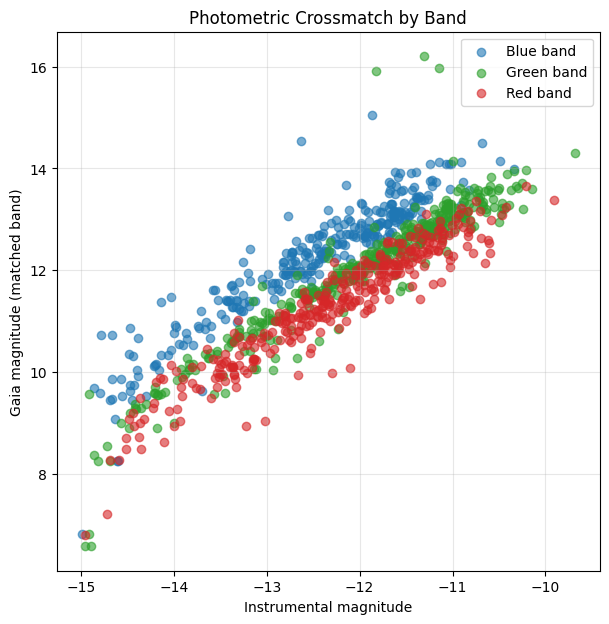

In [29]:
plt.figure(figsize=(7,7))

# Plot per-band using the mapped Gaia magnitude
bands_info = [('b','C0','Blue'), ('g','C2','Green'), ('r','C3','Red')]
for b, col, label in bands_info:
    sel = df_matched['band'] == b
    if sel.any():
        plt.scatter(df_matched.loc[sel, 'mag_inst'], df_matched.loc[sel, 'phot_band_mag'],
                    alpha=0.6, color=col, label=f"{label} band")

plt.xlabel("Instrumental magnitude")
plt.ylabel("Gaia magnitude (matched band)")
plt.title("Photometric Crossmatch by Band")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Air mass calculation 


In [31]:
# Compute per-source airmass and delta_m, store in df_matched
airmass_list = []
delta_m_list = []

# initialize columns in case they don't exist
if 'airmass' not in df_matched.columns:
    df_matched['airmass'] = np.nan
if 'delta_m' not in df_matched.columns:
    df_matched['delta_m'] = np.nan

for filename in df_matched["filename"].unique():

    image_data = df_matched[df_matched["filename"] == filename]
    band = image_data["band"].iloc[0]
    init_path = bands[band]

    # Find the full file path for this filename under init_path
    matches = list(init_path.rglob(filename))
    if len(matches) == 0:
        print(f"File not found: {filename}")
        continue
    file_path = matches[0]

    with fits.open(file_path) as hdul:
        header = hdul[0].header

    obs_time = Time(header.get("DATE-OBS"), format="isot", scale="utc")

    # Some headers use LONGITUD or LONGITUDE; fall back safely
    lon_val = header.get("LONGITUD", header.get("LONGITUDE", 0))
    location = EarthLocation(
        lat=header.get("LATITUDE", 0) * u.deg,
        lon=lon_val * u.deg,
        height=header.get("ALTITUDE", 0) * u.m
    )

    # Rebuild sky coordinates from dataframe
    coords = SkyCoord(
        ra=image_data["ra_image"].values * u.deg,
        dec=image_data["dec_image"].values * u.deg
    )

    altaz_frame = AltAz(obstime=obs_time, location=location)
    altaz = coords.transform_to(altaz_frame)

    # Compute airmass robustly: sec(z) = 1 / cos(zenith_angle).
    # altaz.alt is the altitude; zenith_angle = 90deg - alt
    zenith = (90 * u.deg) - altaz.alt
    secz = 1.0 / np.cos(zenith.to(u.rad))
    X = secz.value

    # Remove bad airmass
    valid = (X > 1) & (X < 5)
    if not np.any(valid):
        continue

    # Assign per-source values back to the dataframe
    valid_idx = image_data.index[valid]
    df_matched.loc[valid_idx, 'airmass'] = X[valid]
    df_matched.loc[valid_idx, 'delta_m'] = (-image_data["mag_inst"].values[valid] + image_data["phot_band_mag"].values[valid])

# After loop, build arrays used for fitting/plotting
airmass = df_matched['airmass'].dropna().values
delta_m = df_matched['delta_m'].dropna().values

# Also expose per-band arrays
airmass_by_band = {}
delta_m_by_band = {}
for b in ['b', 'g', 'r']:
    a = df_matched.loc[df_matched['band'] == b, 'airmass'].dropna().values
    d = df_matched.loc[df_matched['band'] == b, 'delta_m'].dropna().values
    airmass_by_band[b] = a
    delta_m_by_band[b] = d

print('Total stars used:', len(airmass))
for b in ['b', 'g', 'r']:
    print(f"{b} band: {len(airmass_by_band[b])} valid stars")

/tmp/ipykernel_926562/607104661.py:60: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[24.152414321899414 23.883527755737305 23.888707160949707
 23.931276321411133 23.897656440734863 23.825724601745605
 24.03010368347168 24.14509677886963 24.03902530670166 23.94631004333496
 24.128214836120605 23.971665382385254 23.9420747756958 24.363165855407715
 24.00859546661377 24.730971336364746 23.957777976989746
 24.643288612365723 23.87717342376709 24.31569194793701 24.041942596435547
 23.93840980529785 24.147488594055176 24.121569633483887
 23.959003448486328 24.130294799804688 24.093085289001465
 24.138578414916992 24.24579906463623 24.177836418151855
 23.721415519714355 24.252263069152832 23.629633903503418
 23.846745491027832 24.026134490966797 24.014450073242188
 23.695066452026367 23.81768798828125 27.127724647521973
 24.026952743530273 23.637871742248535 23.94489574432373 23.9196834564209
 23.8601388931274

Total stars used: 1030
b band: 310 valid stars
g band: 393 valid stars
r band: 327 valid stars


# From theory

$$m=-2.5\log{\left(\frac{F\times g}{t}\right)}+k\chi +Z_p$$

In [34]:
# Ensure numeric arrays and remove non-finite entries
try:
    airmass = np.asarray(airmass, dtype=float)
    delta_m = np.asarray(delta_m, dtype=float)
except Exception:
    airmass = np.array([float(x) for x in airmass])
    delta_m = np.array([float(x) for x in delta_m])

# Filter finite values
mask = np.isfinite(airmass) & np.isfinite(delta_m)
airmass = airmass[mask]
delta_m = delta_m[mask]

if len(airmass) < 2:
    print("Not enough valid points for fitting")
    k, zp = np.nan, np.nan
else:
    # 3-sigma clipping
    mean = np.mean(delta_m)
    std = np.std(delta_m)
    clip = np.abs(delta_m - mean) < 3 * std

    delta_m = delta_m[clip]
    airmass = airmass[clip]

    if len(airmass) < 2:
        print("Not enough points after clipping for fitting")
        k, zp = np.nan, np.nan
    else:
        # linear fit
        k, zp = np.polyfit(airmass, delta_m, 1)
        print(f"Fit: k={k:.4f}, zp={zp:.4f}")

Fit: k=-0.2789, zp=24.4530


/tmp/ipykernel_926562/2685847394.py:4: UserWarning: Warning: converting a masked element to nan.
  delta_m = np.asarray(delta_m, dtype=float)


/tmp/ipykernel_926562/1442092882.py:14: UserWarning: Warning: converting a masked element to nan.
  d = np.asarray(d, dtype=float)
/tmp/ipykernel_926562/1442092882.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = pd.DataFrame({'airmass': a, 'delta_m': d}).groupby(binned)


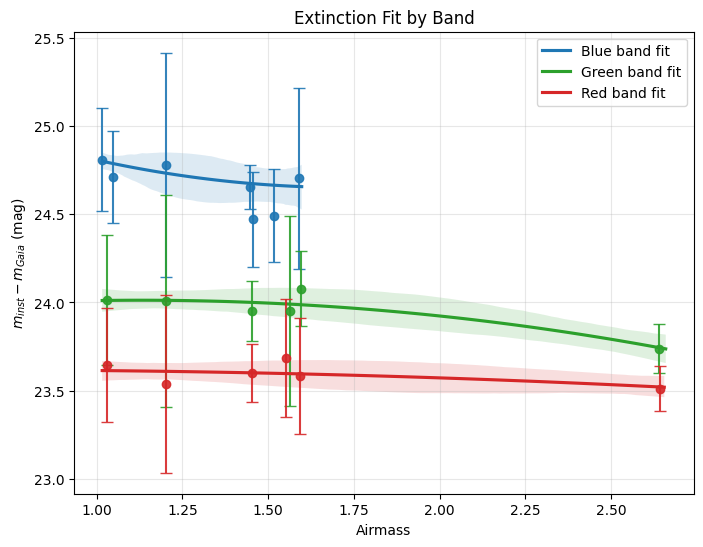

In [48]:
import seaborn as sns
plt.figure(figsize=(8,6))

colors = {'b':'C0','g':'C2','r':'C3'}

n_bins = 20
for b,label in [('b','Blue band'),('g','Green band'),('r','Red band')]:
    a = airmass_by_band.get(b, np.array([]))
    d = delta_m_by_band.get(b, np.array([]))

    # Coerce to float arrays and filter non-finite entries
    try:
        a = np.asarray(a, dtype=float)
        d = np.asarray(d, dtype=float)
    except Exception:
        a = np.array([float(x) for x in a]) if len(a) > 0 else np.array([])
        d = np.array([float(x) for x in d]) if len(d) > 0 else np.array([])

    if len(a) == 0 or len(d) == 0:
        continue

    mask = np.isfinite(a) & np.isfinite(d)
    a = a[mask]
    d = d[mask]
    if len(a) == 0:
        continue

    # Determine reasonable bin count
    bins_local = min(n_bins, max(2, len(a)))

    # Bin and compute mean/std
    binned = pd.cut(a, bins=bins_local)
    grouped = pd.DataFrame({'airmass': a, 'delta_m': d}).groupby(binned)
    bin_centers = grouped['airmass'].apply(np.mean)
    bin_means = grouped['delta_m'].apply(np.mean)
    bin_stds = grouped['delta_m'].apply(np.std)

    # Plot binned points with error bars
    plt.errorbar(bin_centers, bin_means, yerr=bin_stds, fmt='o', markersize=6,
                 capsize=4, color=colors[b], alpha=0.9)

    # Seaborn quadratic regression (no scatter) for this band
    sns.regplot(x=a, y=d, scatter=False, order=2, color=colors[b], label=f"{label} fit", truncate=True)

plt.xlabel("Airmass")
plt.ylabel("$m_{inst} - m_{Gaia}$ (mag)")
plt.title("Extinction Fit by Band")
plt.grid(alpha=0.3)
plt.legend()
plt.show()